In [1]:
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import plotly.offline as pyo
pyo.init_notebook_mode()
from scipy.stats import pearsonr

In [2]:
!pip install vaderSentiment

In [19]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer 
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.tokenize import word_tokenize
import string
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
import nltk
import re
from wordcloud import WordCloud
import nltk
nltk.download('vader_lexicon')
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\sgang\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sgang\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\sgang\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\sgang\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\wordnet.zip.


True

In [4]:
df = pd.read_csv("./trump_tweets.csv")

In [5]:
df.head()

,id,text,isRetweet,isDeleted,device,favorites,retweets,date,isFlagged
0,1.698309e+09,Be sure to tune in and watch Donald Trump on L...,f,f,Twitter Web Client,939,519,5/4/2009 18:54,f
1,1.701461e+09,Donald Trump will be appearing on The View tom...,f,f,Twitter Web Client,259,34,5/5/2009 1:00,f
2,1.737480e+09,Donald Trump reads Top Ten Financial Tips on L...,f,f,Twitter Web Client,37,15,5/8/2009 13:38,f
3,1.741161e+09,New Blog Post: Celebrity Apprentice Finale and...,f,f,Twitter Web Client,29,11,5/8/2009 20:40,f
4,1.773561e+09,"""""""My persona will never be that of a wallflow...",f,f,Twitter Web Client,1877,1321,5/12/2009 14:07,f


In [8]:
%%time

SIA = SentimentIntensityAnalyzer()

sentiment = []
for i in range(len(df)):
    sentiment.append(SIA.polarity_scores(df.loc[i]['text'])['compound'])
    
df['sentiment'] = sentiment

Wall time: 17.6 s


In [9]:
def month_rounder(t):
    return (t.replace(month=t.month, day=1, hour=0, second=0, microsecond=0, minute=0))

month = []
for i in range(len(df)):
    month.append(month_rounder(datetime.strptime(df['date'][i], '%m/%d/%Y %H:%M')))
    
df['month'] = month

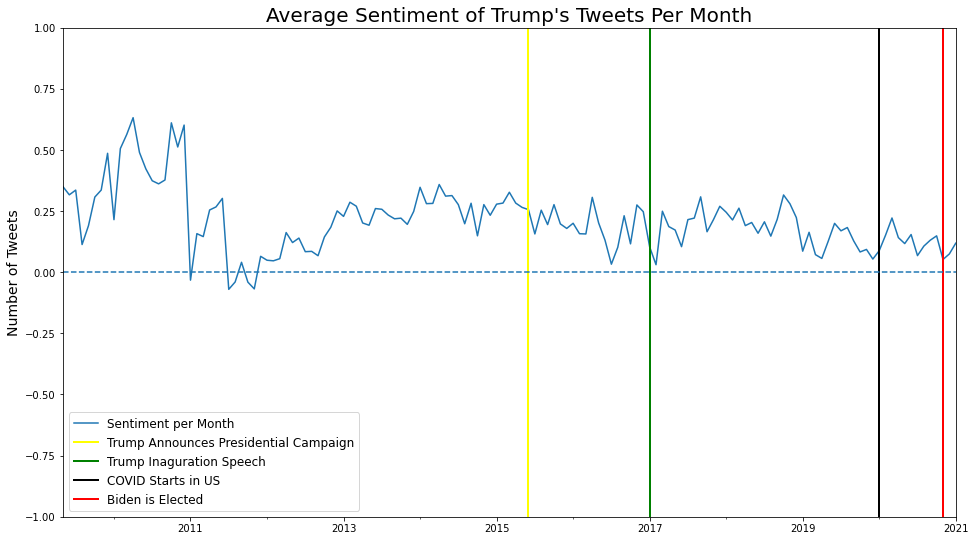

In [10]:
df.groupby('month').mean().reset_index().plot(x="month", y="sentiment", figsize=(16, 9))
plt.axvline(datetime(2015, 6, 15), color='yellow', linewidth=2)
plt.axvline(datetime(2017, 1, 20), color='green', linewidth=2)
plt.axvline(datetime(2020, 1, 15), color='black', linewidth=2)
plt.axvline(datetime(2020, 11, 7), color='red', linewidth=2)
plt.xlim(df['month'][0], df['month'][len(df)-1])
plt.ylim(-1, 1)
plt.axhline(0, linestyle='--')
plt.legend(['Sentiment per Month', 'Trump Announces Presidential Campaign', 'Trump Inaguration Speech', 'COVID Starts in US', 'Biden is Elected'], prop={'size': 12})
plt.title("Average Sentiment of Trump's Tweets Per Month", fontsize=20)
plt.xlabel("")
plt.ylabel("Number of Tweets", fontsize=14)
plt.show()

In [11]:
px.scatter(df, x="favorites", y="sentiment", title="Number of Likes vs Sentiment Interactive Graph")

In [12]:
px.scatter(df, x="retweets", y="sentiment", title="Number of Retweets vs Sentiment Interactive Graph")

## What Words does Trump like to Tweet...

In [15]:
stop_words = set(stopwords.words('english'))
table = str.maketrans('', '', string.punctuation)
lemmatizer = WordNetLemmatizer()

def clean(text):
    text = re.sub(r"www\S+", '', str(text), flags=re.MULTILINE) #filters out links
    text = re.sub(r"http\S+", '', str(text), flags=re.MULTILINE) #filters out links
    tokens = word_tokenize(text) #split into words
    tokens = [w.lower() for w in tokens] #make everything lowercase
    stripped = [w.translate(table) for w in tokens] #get rid of punctuation
    words = [word for word in stripped if word.isalpha()] #idk
    words = [w for w in words if not w in stop_words] #get rid of stop words like "no"
    lemma = [lemmatizer.lemmatize(word, 'v') for word in words] #lemmatization/stemming
    return lemma



In [20]:
%%time

blacklisted_words = ['realdonaldtrump', 'rt', 'amp', 'nt','https','the','and','on']
words_dict = {}

for i in range(len(df)):
    curr_tweet = clean(df.loc[i]['text'])
    for word in curr_tweet:
        if word in blacklisted_words:
            continue
        if word in words_dict:
            words_dict[word] += 1
        else:
            words_dict[word] = 1

Wall time: 23.8 s


In [21]:
sorted_dict = dict(sorted(words_dict.items(), key=lambda item: item[1], reverse=True))
words_df = pd.DataFrame.from_dict(sorted_dict, orient='index', columns=['count']).reset_index()
words_df[:30]

,index,count
0,great,7642
1,trump,6800
2,thank,5884
3,president,4730
4,get,4183
5,people,3522
6,make,3478
7,go,3292
8,us,2804
9,vote,2577


In [22]:
px.bar(words_df[:30], x="index", y="count", title="Trump's Top 30 Most Tweeted Words")

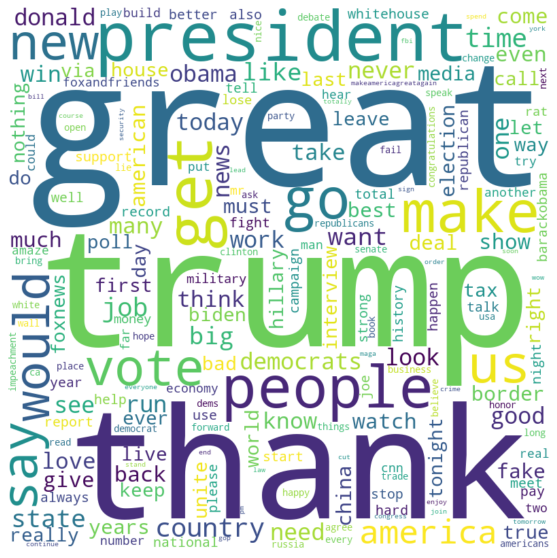

In [23]:
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white')
wordcloud.generate_from_frequencies(words_dict)
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Trump's Tweeting Per Hour/Day

In [24]:
def day_rounder(t):
    return (t.replace(day=t.day, hour=0, second=0, microsecond=0, minute=0))

def hour_rounder(t):
    # Rounds to nearest hour by adding a timedelta hour if minute >= 30
    return (t.replace(second=0, microsecond=0, minute=0, hour=t.hour)
               +timedelta(hours=t.minute//30))

day = []
for i in range(len(df)):
    day.append(day_rounder(datetime.strptime(df['date'][i], '%m/%d/%Y %H:%M')))

hour = []
for i in range(len(df)):
    hour.append(hour_rounder(datetime.strptime(df['date'][i], '%m/%d/%Y %H:%M')))
    
df['day'] = day
df['hour'] = hour

In [25]:
day_df = pd.DataFrame(df.groupby('day').size(), columns=['count']).reset_index()
day_df

,day,count
0,2009-05-04,1
1,2009-05-05,1
2,2009-05-08,2
3,2009-05-12,2
4,2009-05-13,1
...,...,...
3495,2021-01-03,43
3496,2021-01-04,11
3497,2021-01-05,22
3498,2021-01-06,25


In [26]:
hour_df = pd.DataFrame(df.groupby('hour').size(), columns=['count']).reset_index()
hour_df

,hour,count
0,2009-05-04 19:00:00,1
1,2009-05-05 01:00:00,1
2,2009-05-08 14:00:00,1
3,2009-05-08 21:00:00,1
4,2009-05-12 14:00:00,1
...,...,...
20872,2021-01-06 21:00:00,1
20873,2021-01-06 23:00:00,1
20874,2021-01-08 00:00:00,1
20875,2021-01-08 15:00:00,1


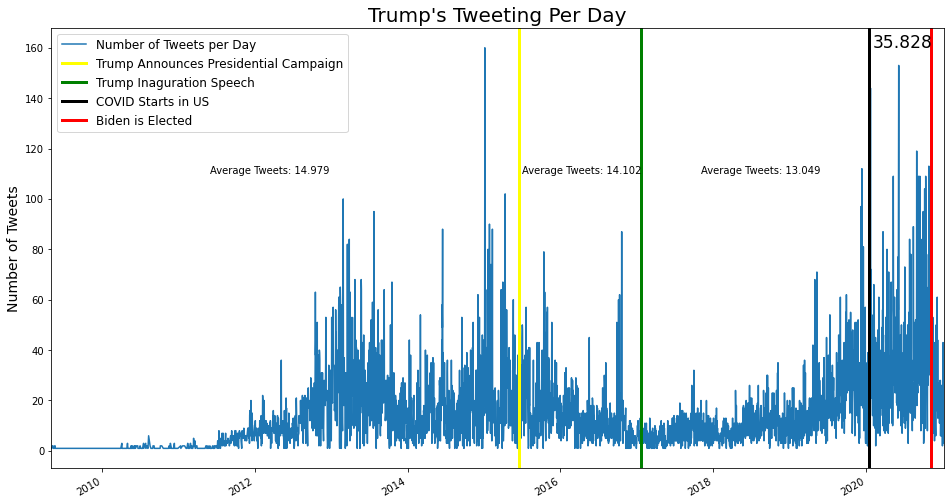

In [27]:
df.groupby('day').size().plot(figsize=(16, 9))
plt.axvline(datetime(2015, 6, 15), color='yellow', linewidth=3)
plt.axvline(datetime(2017, 1, 20), color='green', linewidth=3)
plt.axvline(datetime(2020, 1, 15), color='black', linewidth=3)
plt.axvline(datetime(2020, 11, 7), color='red', linewidth=3)
plt.annotate("Average Tweets: %.3f" % day_df.loc[day_df['day'] < datetime(2015, 6, 15)]['count'].mean(), (datetime(2011, 6, 1), 110), fontsize=10)
plt.annotate("Average Tweets: %.3f" % day_df.loc[(datetime(2015, 6, 15) <= day_df['day']) & (day_df['day'] < datetime(2017, 1, 20))]['count'].mean(), (datetime(2015, 6, 30), 110), fontsize=10)
plt.annotate("Average Tweets: %.3f" % day_df.loc[(datetime(2017, 1, 20) <= day_df['day']) & (day_df['day'] < datetime(2020, 1, 15))]['count'].mean(), (datetime(2017, 11, 1), 110), fontsize=10)
plt.annotate("%.3f" % day_df.loc[(datetime(2020, 1, 15) <= day_df['day']) & (day_df['day'] < datetime(2020, 11, 7))]['count'].mean(), (datetime(2020, 2, 1), 160), fontsize=17)
plt.xlim(df['day'][0], df['day'][len(df)-1])
plt.legend(['Number of Tweets per Day', 'Trump Announces Presidential Campaign', 'Trump Inaguration Speech', 'COVID Starts in US', 'Biden is Elected'], prop={'size': 12})
plt.title("Trump's Tweeting Per Day", fontsize=20)
plt.xlabel("")
plt.ylabel("Number of Tweets", fontsize=14)
plt.show()

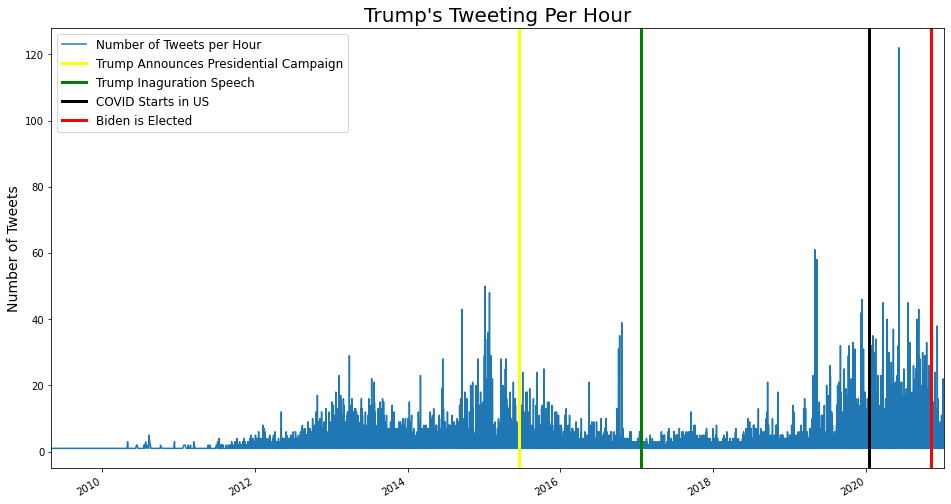

In [28]:
df.groupby('hour').size().plot(figsize=(16, 9))
plt.axvline(datetime(2015, 6, 15), color='yellow', linewidth=3)
plt.axvline(datetime(2017, 1, 20), color='green', linewidth=3)
plt.axvline(datetime(2020, 1, 15), color='black', linewidth=3)
plt.axvline(datetime(2020, 11, 7), color='red', linewidth=3)
plt.xlim(df['day'][0], df['day'][len(df)-1])
plt.legend(['Number of Tweets per Hour', 'Trump Announces Presidential Campaign', 'Trump Inaguration Speech', 'COVID Starts in US', 'Biden is Elected'], prop={'size': 12})
plt.title("Trump's Tweeting Per Hour", fontsize=20)
plt.xlabel("")
plt.ylabel("Number of Tweets", fontsize=14)
plt.show()

Favorites vs Retweets

In [29]:
fig = go.Figure()
px.scatter(df, x="retweets", y="favorites", title="Retweets vs Favorites Interactive Scatter Plot, Correlation Coefficient: %.3f" % pearsonr(df['retweets'], df['favorites'])[0])